In [5]:
import cPickle as pickle
import numpy as np
import tensorflow as tf



with open("read_data.pickle", "r") as f:
    x = pickle.load(f)
    train_pics = x["pics"]
    train_labels = x["labels"]
    
print train_pics.shape, train_labels.shape


def accuracy(predictions, labels):
  return (100.0 * np.sum(np.argmax(predictions, 1) == np.argmax(labels, 1))
          / predictions.shape[0])



(180, 480, 640, 3) (180, 4)


In [6]:
# print train_pics[0]
train_pics = (train_pics -128)/256.0
# print train_pics

In [7]:
def randomize(dataset, labels):
  permutation = np.random.permutation(labels.shape[0])
  shuffled_dataset = dataset[permutation,:,:]
  shuffled_labels = labels[permutation]
  return shuffled_dataset, shuffled_labels

train_pics, train_labels = randomize(train_pics, train_labels)

In [8]:
batch_size = 64
patch_size1 = 10
patch_size2 = 5
depth1 = 9
depth2 = 24
num_hidden = 128
image_height = 480
image_width = 640
num_channels = 3
num_labels = 4

graph = tf.Graph()

with graph.as_default():

  # Input data.
  tf_train_dataset = tf.placeholder(
    tf.float32, shape=(batch_size, image_height, image_width, num_channels))
  tf_train_labels = tf.placeholder(tf.float32, shape=(batch_size, num_labels))
#   tf_valid_dataset = tf.constant(valid_dataset)
  
  tf_test_data = tf.placeholder(
    tf.float32, shape=(1, image_height, image_width, num_channels))
    
  # Variables.
  layer1_weights = tf.Variable(tf.truncated_normal(
      [patch_size1, patch_size1, num_channels, depth1], stddev=0.1))
  layer1_biases = tf.Variable(tf.zeros([depth1]))
  layer2_weights = tf.Variable(tf.truncated_normal(
      [patch_size2, patch_size2, depth1, depth2], stddev=0.1))
  layer2_biases = tf.Variable(tf.constant(1.0, shape=[depth2]))
  layer3_weights = tf.Variable(tf.truncated_normal(
      [6384, num_hidden], stddev=0.1))
  layer3_biases = tf.Variable(tf.constant(1.0, shape=[num_hidden]))
  layer4_weights = tf.Variable(tf.truncated_normal(
      [num_hidden, num_labels], stddev=0.1))
  layer4_biases = tf.Variable(tf.constant(1.0, shape=[num_labels]))
  

  # Model.
  def model(data):
    conv1 = tf.nn.conv2d(data, layer1_weights, [1, 4, 4, 1], padding='VALID')
    bias1 = tf.nn.relu(conv1 + layer1_biases)
    pool1 = tf.nn.max_pool(bias1, [1, 2, 2, 1], [1, 2, 2, 1], padding='SAME')
    conv2 = tf.nn.conv2d(pool1, layer2_weights, [1, 2, 2, 1], padding='VALID')
    bias2 = tf.nn.relu(conv2 + layer2_biases)
    pool2 = tf.nn.max_pool(bias2, [1, 2, 2, 1], [1, 2, 2, 1], padding='SAME')
    shape = pool2.get_shape().as_list()
    reshape = tf.reshape(pool2, [shape[0], shape[1] * shape[2] * shape[3]])
    hidden = tf.nn.relu(tf.matmul(reshape, layer3_weights) + layer3_biases)
    return tf.matmul(hidden, layer4_weights) + layer4_biases
 
  with tf.device("/gpu:1"):
      # Training computation.
      logits = model(tf_train_dataset)
      loss = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits(logits, tf_train_labels))

      # Optimizer.
      optimizer = tf.train.GradientDescentOptimizer(0.005).minimize(loss)

      # Predictions for the training, validation, and test data.
      train_prediction = tf.nn.softmax(logits)
    #   valid_prediction = tf.nn.softmax(model(tf_valid_dataset))
    #   test_prediction = tf.nn.softmax(model(tf_test_dataset))
        
        
      test_prediction = tf.nn.softmax(model(tf_test_data))
  saver = tf.train.Saver()


num_steps = 501
with tf.Session(graph=graph) as session:
  tf.initialize_all_variables().run()
  print('Initialized')
  for step in range(num_steps):
    train_pics, train_labels = randomize(train_pics, train_labels)
    
    offset = (step * batch_size) % (train_labels.shape[0] - batch_size)
    batch_data = train_pics[offset:(offset + batch_size), :, :, :]
    batch_labels = train_labels[offset:(offset + batch_size), :]
    
    feed_dict = {tf_train_dataset : batch_data, tf_train_labels : batch_labels}
    _, l, predictions = session.run(
      [optimizer, loss, train_prediction], feed_dict=feed_dict)
#         print (predictions.shape)

    if (step % 10 == 0):
      print('Minibatch loss at step %d: %0.2f' % (step, l))
      print('Minibatch accuracy: %.1f%%' % accuracy(predictions, batch_labels))
#       print predictions
        
    
    if (step % 100 == 0) and step >0:
        saver.save(session, "obs-model-"+str(step)+".ckpt")
        print ("!!!!! obs-model-"+str(step)+".ckpt" + " is written !!!!!  Good !")

#   while 1:
#         time.sleep(5)
#         ret, raw = camera.retrieve()

#         raw = (raw-128)/256.0
#         plt.imshow(raw*256.0+128)
#         plt.show()

#         if ret:
#             feed_dict = {tf_test_data: np.array([raw])}
#             prediction = session.run(test_prediction, feed_dict=feed_dict)
#             prediction = list(prediction[0])
#             print prediction
#             if prediction.index(max(prediction))==0:
#                 s.send("ff 0.4")
#                 print "ff"
#             elif prediction.index(max(prediction))==1:
#                 s.send("bb 0.4")
#                 print "bb"
#             elif prediction.index(max(prediction))==2:
#                 s.send("ll 0.4")
#                 print "ll"
#             elif prediction.index(max(prediction))==3:
#                 s.send("rr 0.4")
#                 print "rr"

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
Minibatch loss at step 0: 11.88
Minibatch accuracy: 25.0%
Minibatch loss at step 10: 2.93
Minibatch accuracy: 23.4%
Minibatch loss at step 20: 2.80
Minibatch accuracy: 18.8%
Minibatch loss at step 30: 1.47
Minibatch accuracy: 28.1%
Minibatch loss at step 40: 1.29
Minibatch accuracy: 40.6%
Minibatch loss at step 50: 1.29
Minibatch accuracy: 45.3%
Minibatch loss at step 60: 1.35
Minibatch accuracy: 29.7%
Minibatch loss at step 70: 1.26
Minibatch accuracy: 42.2%
Minibatch loss at step 80: 1.33
Minibatch accuracy: 32.8%
Minibatch loss at step 90: 1.40
Minibatch accuracy: 31.2%
Minibatch loss at step 100: 1.21
Minibatch accuracy: 59.4%
!!!!! obs-model-100.ckpt is written !!!!!  Good !
Minibatch loss at step 110: 1.12
Minibatch accuracy: 60.9%
Minibatch loss at step 120: 1.09
Minibatch accuracy: 62.5%
Minibatch loss at step 130: 1.19
Minibatch accuracy: 46.9%
Minibatch loss at step 140: 1.18
Minibatch accur

[ 0.  0.  1.  0.]


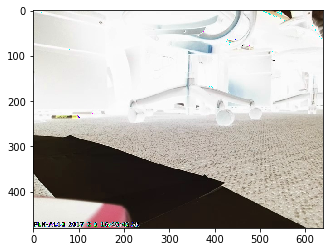

[ 0.  0.  0.  1.]


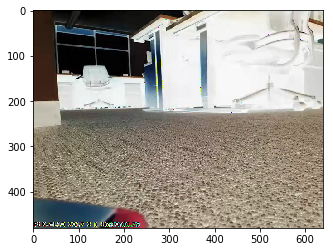

[ 0.  0.  1.  0.]


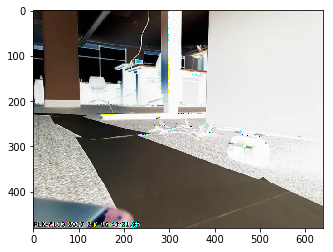

[ 0.  1.  0.  0.]


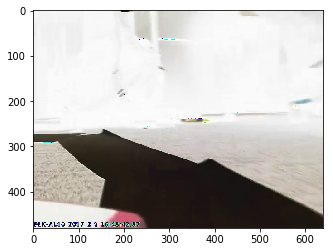

[ 0.  0.  1.  0.]


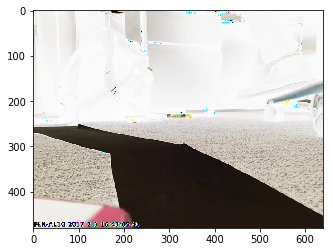

[ 1.  0.  0.  0.]


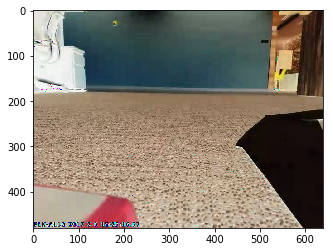

[ 0.  1.  0.  0.]


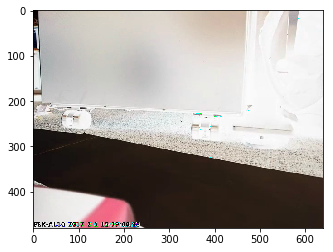

[ 0.  0.  1.  0.]


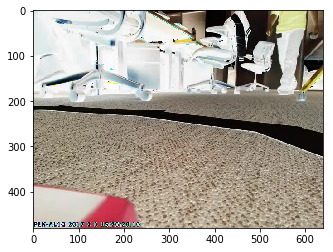

[ 1.  0.  0.  0.]


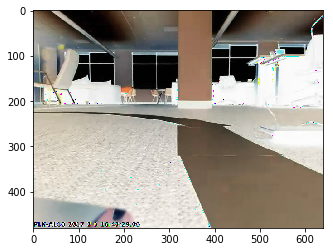

[ 0.  0.  0.  1.]


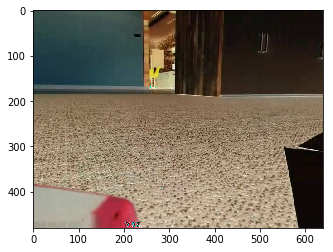

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt

for ii in range(10):
    plt.imshow(train_pics[ii] * 256.0 + 128.0)
    print train_labels[ii]
    plt.show()
    


Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  1.68013214e-09   1.54553786e-10   1.00000000e+00   2.46214646e-11]]
[ 0.  0.  1.  0.]


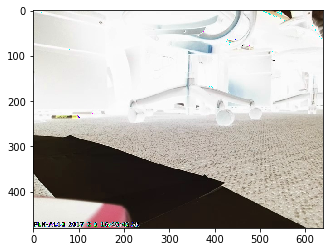

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  8.48929121e-05   5.91388531e-03   8.93167407e-09   9.94001210e-01]]
[ 0.  0.  0.  1.]


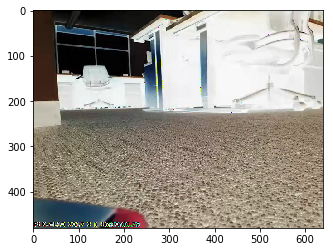

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  9.91654992e-01   7.99024664e-03   3.54808726e-04   1.38575186e-12]]
[ 0.  0.  1.  0.]


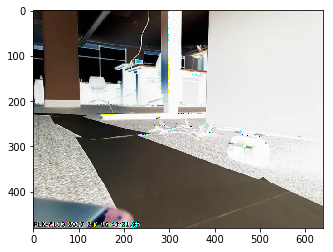

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  5.17514243e-04   7.62733042e-01   1.08316244e-05   2.36738607e-01]]
[ 0.  1.  0.  0.]


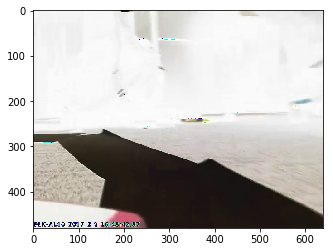

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  6.95141435e-01   6.32807836e-02   1.89680759e-05   2.41558760e-01]]
[ 0.  0.  1.  0.]


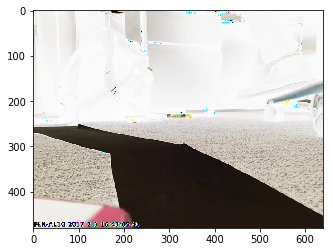

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  8.64782638e-12   1.39249892e-08   9.99995947e-01   4.02068872e-06]]
[ 1.  0.  0.  0.]


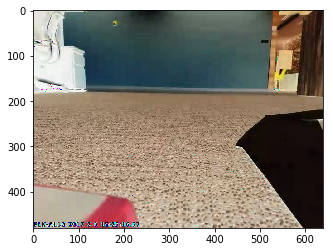

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[ 0.00168775  0.10215127  0.05153581  0.84462517]]
[ 0.  1.  0.  0.]


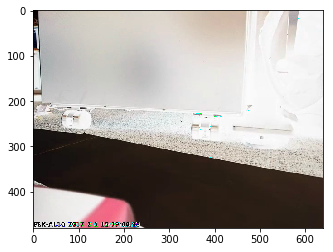

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  1.00000000e+00   5.09319831e-09   6.21413643e-10   2.68972535e-11]]
[ 0.  0.  1.  0.]


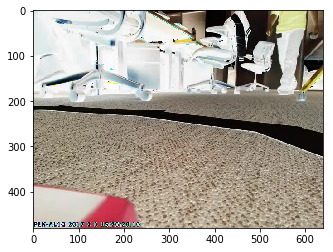

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  1.05687669e-02   2.15572407e-04   3.55335884e-02   9.53682005e-01]]
[ 1.  0.  0.  0.]


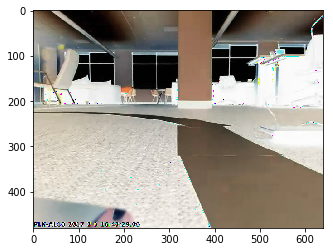

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  9.77130532e-01   1.44863279e-05   2.28358507e-02   1.92534299e-05]]
[ 0.  0.  0.  1.]


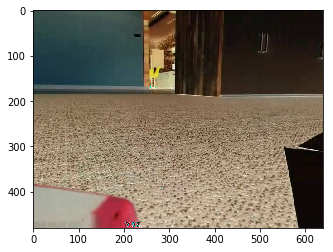

Instructions for updating:
Use `tf.global_variables_initializer` instead.
Initialized
[[  9.29759979e-01   2.63111535e-02   4.18166138e-07   4.39284667e-02]]
[ 0.  0.  0.  1.]


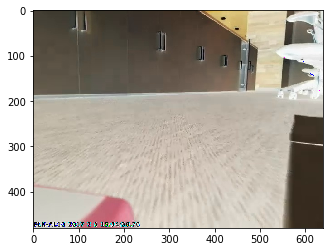

In [7]:
test_num = 2
for test_num in range(11):
    with tf.Session(graph=graph) as session:
        tf.initialize_all_variables().run()
        print('Initialized')
        feed_dict = {tf_test_data: np.array([train_pics[test_num]])}
        prediction = session.run(test_prediction, feed_dict=feed_dict)
        print prediction

    plt.imshow(train_pics[test_num] * 256.0 + 128.0)
    print train_labels[test_num]
    plt.show()

Initialized


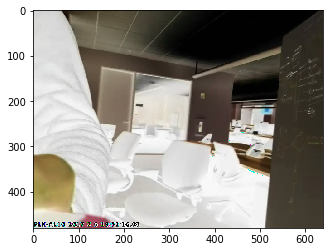

[0.18687035, 0.13307385, 0.061628126, 0.61842757]
rr


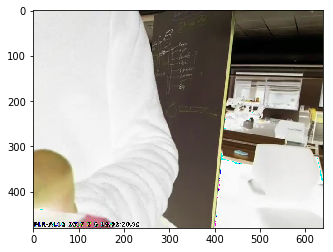

[0.35828555, 0.34184611, 0.21832812, 0.081540234]
ff


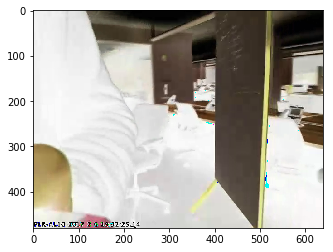

[0.17623991, 0.15757589, 0.54848093, 0.11770324]
ll


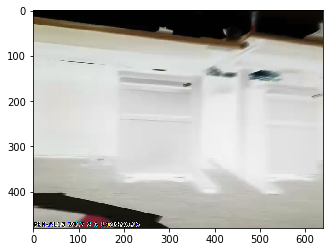

[0.25807407, 0.24846128, 0.44412005, 0.049344551]
ll


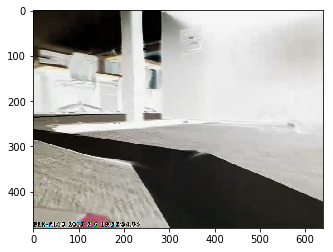

[0.14029889, 0.3584674, 0.44570711, 0.055526596]
ll


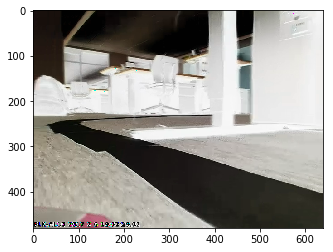

[0.23474519, 0.20997018, 0.48909715, 0.066187479]
ll


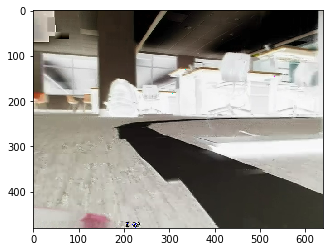

[0.046468854, 0.20271608, 0.67726338, 0.073551662]
ll


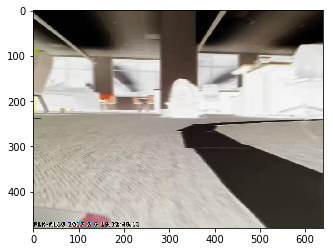

[0.32149401, 0.12296534, 0.28914472, 0.26639593]
ff


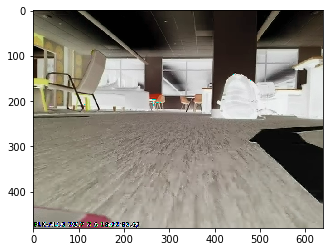

[0.40688887, 0.51798218, 0.027184347, 0.047944527]
bb


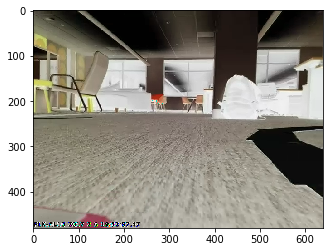

[0.19343914, 0.76329434, 0.028936991, 0.014329486]
bb


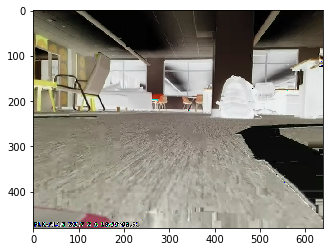

[0.31049466, 0.55932754, 0.045780972, 0.08439678]
bb


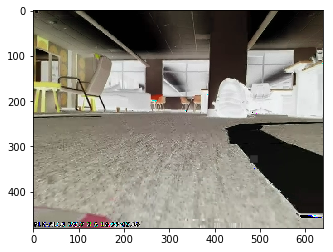

[0.3483026, 0.36148682, 0.069870174, 0.22034037]
bb


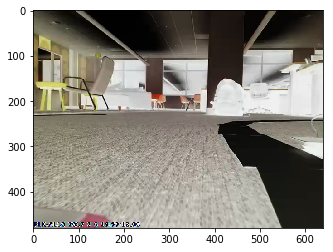

[0.21951309, 0.28503519, 0.18738468, 0.30806705]
rr


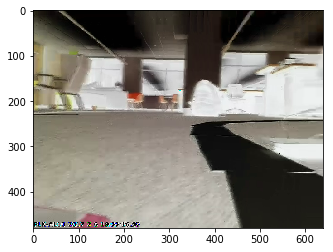

[0.46904793, 0.1031932, 0.0087290211, 0.41902986]
ff


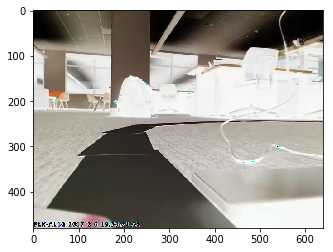

[0.070376188, 0.70186585, 0.088637851, 0.13912012]
bb


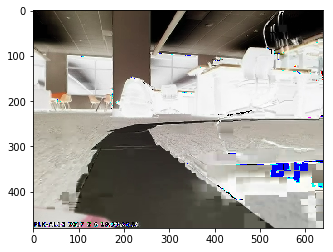

[0.088119425, 0.68982798, 0.14979182, 0.072260849]
bb


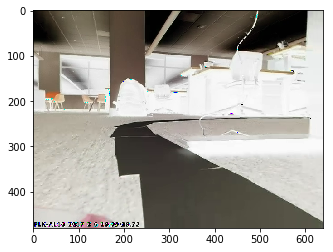

[0.11474418, 0.4028767, 0.4224906, 0.05988856]
ll


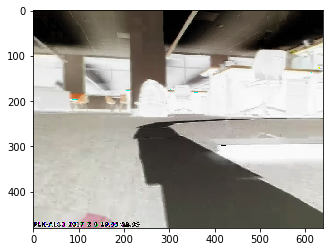

[0.079707608, 0.13626899, 0.6134907, 0.17053267]
ll


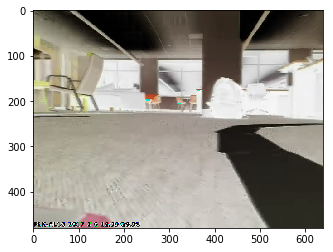

[0.36401388, 0.12406868, 0.25147441, 0.26044306]
ff


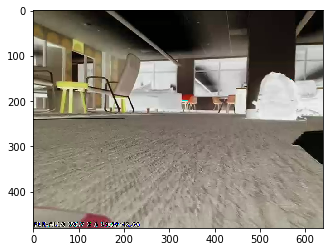

[0.66393, 0.18151706, 0.013696436, 0.14085649]
ff


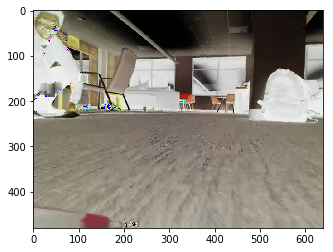

[0.73228002, 0.09658324, 0.017616183, 0.15352051]
ff


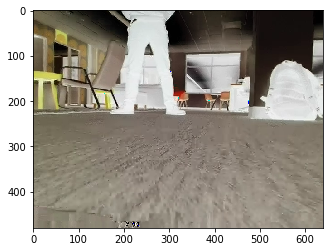

[0.54328394, 0.39216074, 0.04781431, 0.016740983]
ff


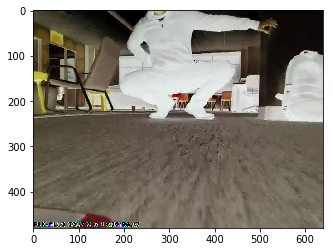

[0.034756862, 0.64668632, 0.29395601, 0.024600832]
bb


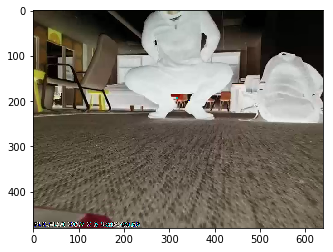

[0.15727453, 0.62597769, 0.16359751, 0.053150296]
bb


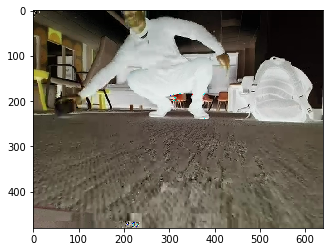

[0.070126265, 0.76043892, 0.163978, 0.0054567927]
bb


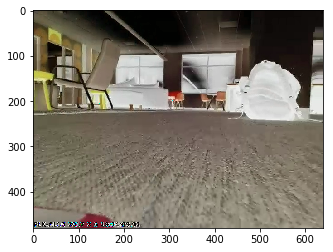

[0.55749911, 0.41453567, 0.018004645, 0.0099606235]
ff


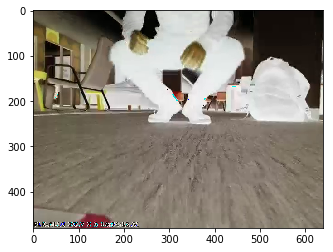

[0.10839974, 0.83089471, 0.036291793, 0.024413859]
bb


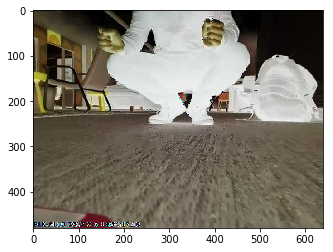

[0.012610076, 0.88609922, 0.093736365, 0.0075544701]
bb


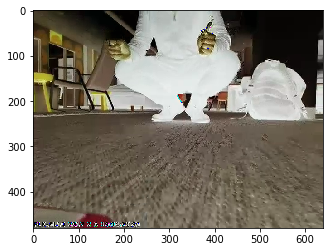

[0.033903368, 0.76282042, 0.19309829, 0.010177875]
bb


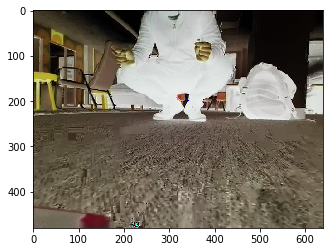

[0.12212772, 0.4879756, 0.33167642, 0.058220349]
bb


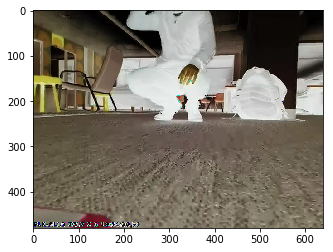

[0.12620072, 0.69551528, 0.084409297, 0.093874753]
bb


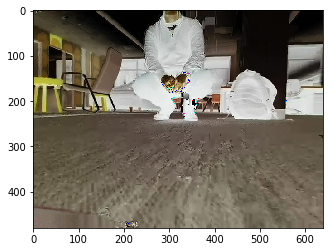

[0.045841649, 0.7913264, 0.133112, 0.029720012]
bb


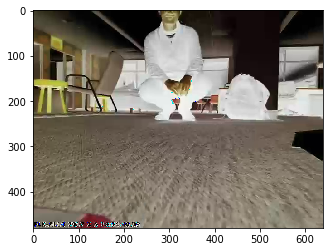

[0.73204559, 0.059141625, 0.11476796, 0.094044842]
ff


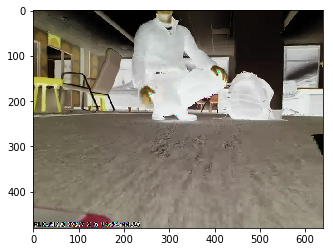

[0.81952798, 0.15476015, 0.0090195071, 0.016692365]
ff


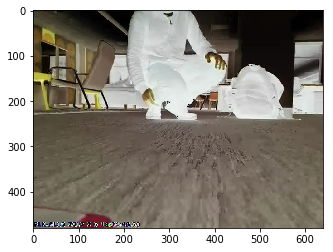

[0.092355482, 0.78231877, 0.11055212, 0.014773553]
bb


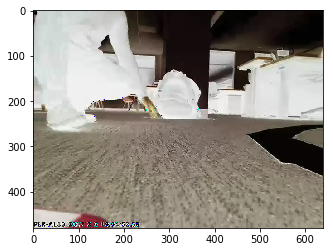

[0.80162758, 0.14551827, 0.035705283, 0.01714878]
ff


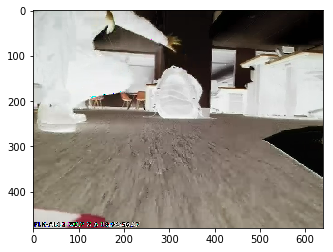

[0.85350281, 0.11834396, 0.023619622, 0.0045336024]
ff


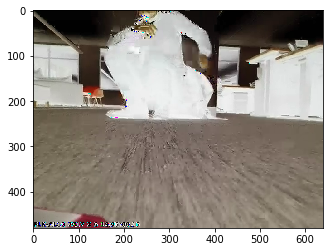

[0.83419049, 0.11792745, 0.037809059, 0.010072977]
ff


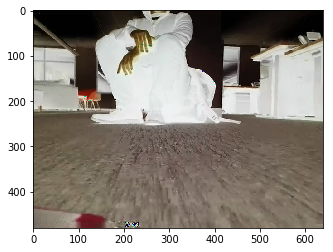

[0.3191222, 0.60358423, 0.055074941, 0.022218639]
bb


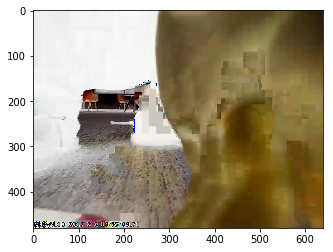

[0.38130584, 0.0065084011, 0.24147265, 0.37071306]
ff


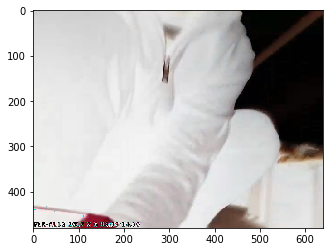

[0.18219835, 0.28205568, 0.45084471, 0.084901221]
ll


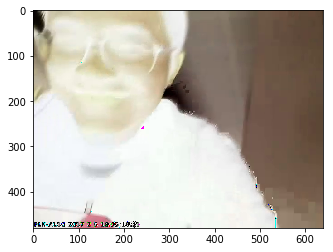

[0.48332199, 0.0092539079, 0.24977282, 0.2576513]
ff


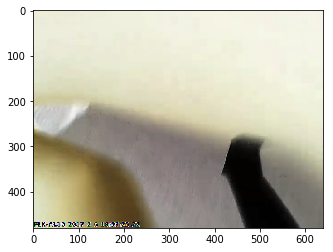

[0.062142175, 0.72728461, 0.20673923, 0.003834021]
bb


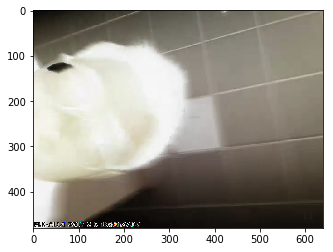

[0.79592294, 0.122218, 0.079735808, 0.0021233354]
ff


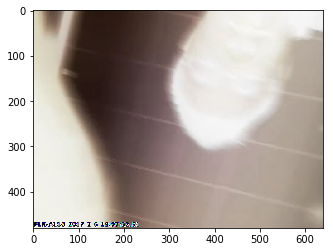

[0.074084431, 0.82189941, 0.03834831, 0.065667786]
bb


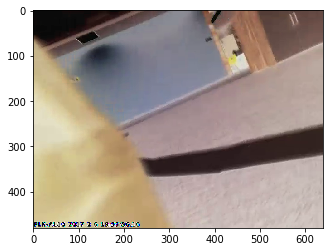

[0.68851334, 0.1900835, 0.049629744, 0.071773425]
ff


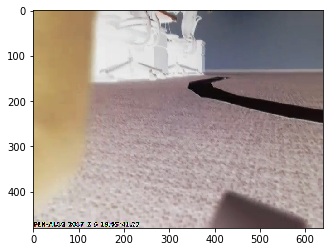

[0.050711703, 0.0027510147, 0.022124207, 0.92441308]
rr


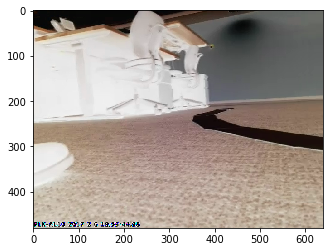

[0.28170127, 0.15876123, 0.012651249, 0.54688632]
rr


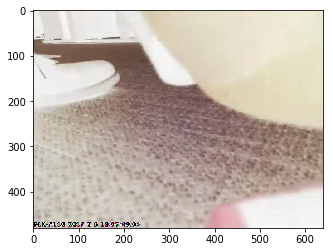

[0.38384202, 0.48183197, 0.014023928, 0.12030209]
bb


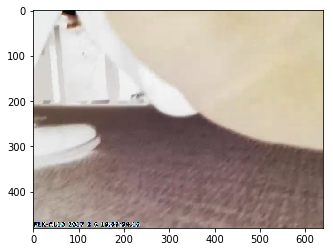

[0.55471539, 0.083040573, 0.31085935, 0.051384643]
ff


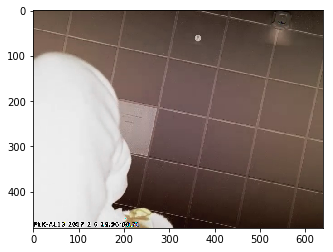

[0.8880403, 0.047770597, 0.025015477, 0.039173596]
ff


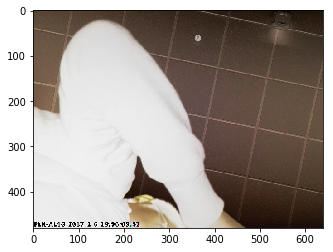

[0.86555505, 0.054022022, 0.040088426, 0.040334482]
ff


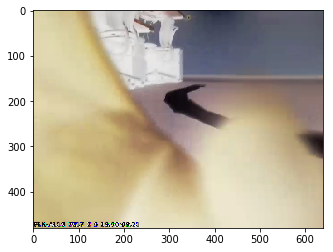

[0.26784551, 0.026338801, 0.030562667, 0.67525303]
rr


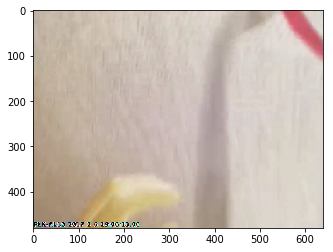

[0.10426804, 0.17103079, 0.67985767, 0.044843506]
ll


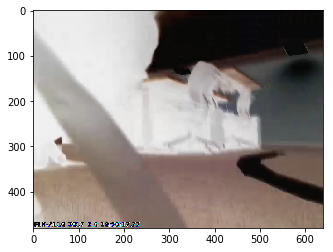

[0.18823895, 0.20544235, 0.58574402, 0.020574691]
ll


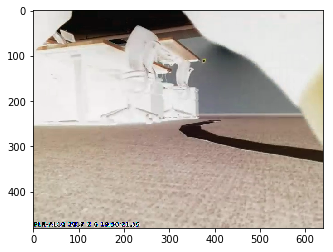

[0.6538465, 0.072864987, 0.12570198, 0.14758652]
ff


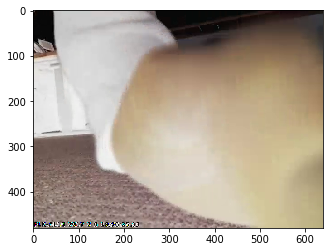

[0.051767386, 0.41674668, 0.48273325, 0.048752747]
ll


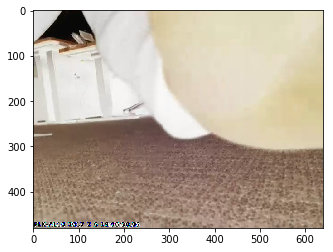

[0.20766346, 0.50455546, 0.26398262, 0.023798391]
bb


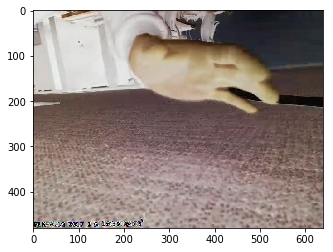

[0.93125087, 0.046392903, 0.0086356867, 0.013720678]
ff


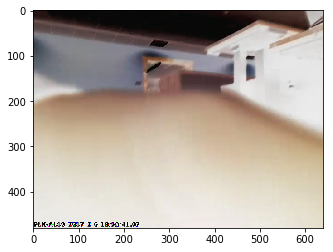

[0.3683683, 0.25095102, 0.065959595, 0.31472111]
ff


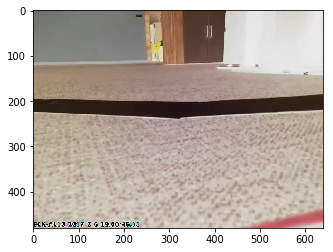

[0.55628335, 0.17156614, 0.16407235, 0.10807816]
ff


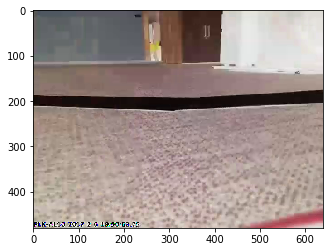

[0.77712619, 0.014330936, 0.012883889, 0.19565895]
ff


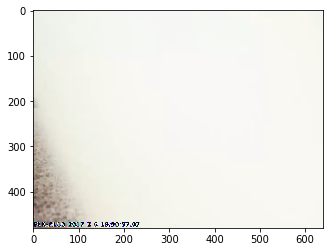

[0.17876545, 0.25641274, 0.48961043, 0.075211346]
ll


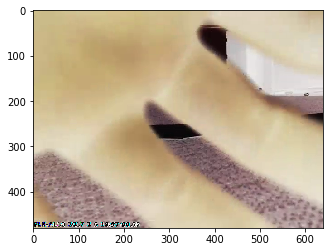

[0.13289011, 0.3595019, 0.48623642, 0.021371588]
ll


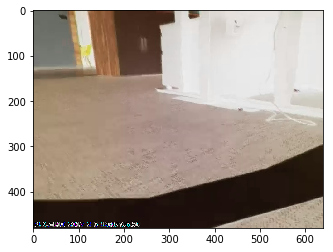

[0.3233977, 0.23083234, 0.34103125, 0.1047387]
ll


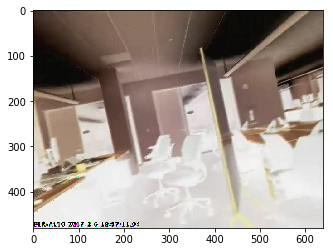

[0.066540711, 0.034887251, 0.032647904, 0.86592412]
rr


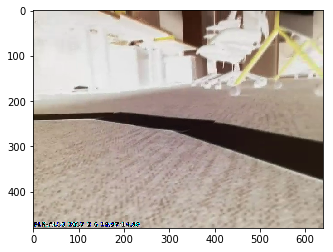

[0.55704051, 0.054191697, 0.30251414, 0.086253583]
ff


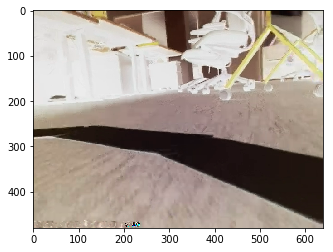

[0.32351315, 0.23391819, 0.39354402, 0.04902472]
ll


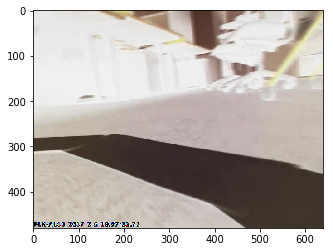

[0.045580532, 0.16029842, 0.73032975, 0.063791253]
ll


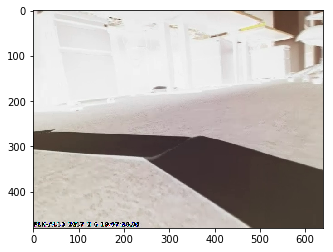

[0.040623482, 0.42537412, 0.49635917, 0.037643276]
ll


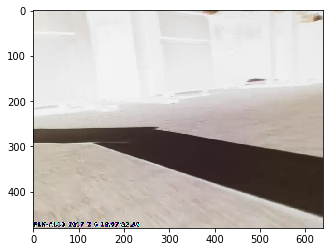

[0.14631371, 0.1299939, 0.67423308, 0.0494592]
ll


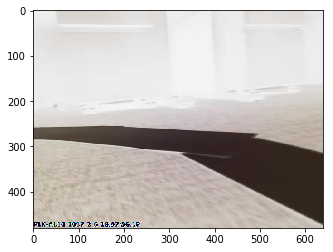

[0.33080676, 0.16574869, 0.43175966, 0.071684949]
ll


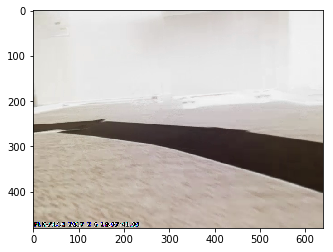

[0.46784046, 0.14157726, 0.27777717, 0.11280503]
ff


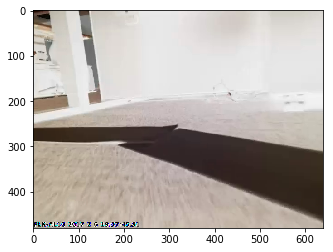

[0.23688023, 0.16009195, 0.53514415, 0.067883641]
ll


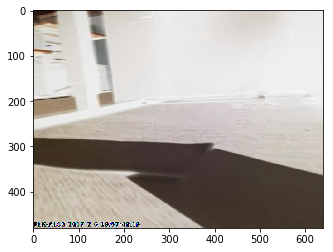

[0.018394398, 0.41199476, 0.50666243, 0.062948421]
ll


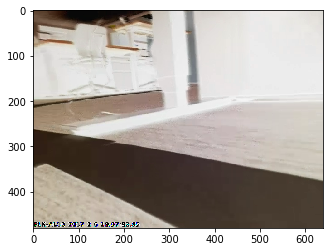

[0.0088659115, 0.41774017, 0.55735457, 0.016039327]
ll


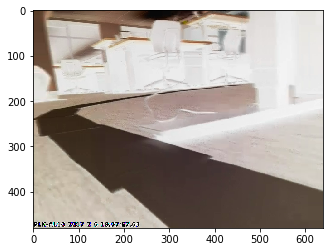

[0.012148837, 0.45121878, 0.52094048, 0.015691873]
ll


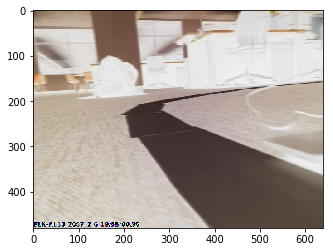

[0.19087502, 0.15062562, 0.61940986, 0.039089475]
ll


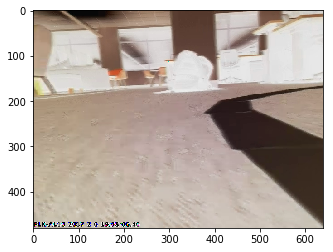

[0.59994185, 0.14949387, 0.18744966, 0.063114718]
ff


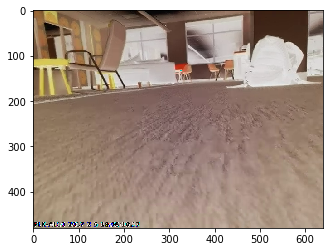

[0.53653467, 0.24254228, 0.028318731, 0.19260442]
ff


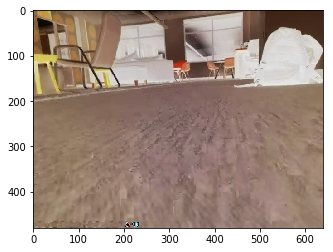

[0.47502211, 0.32520083, 0.052234348, 0.14754279]
ff


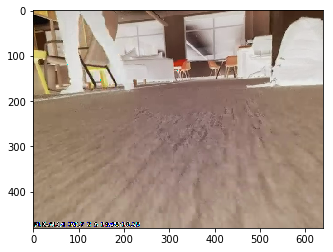

[0.22210984, 0.33252421, 0.18185143, 0.26351446]
bb


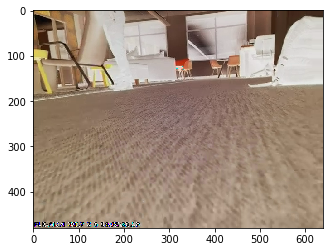

[0.29316831, 0.2907258, 0.030722391, 0.38538355]
rr


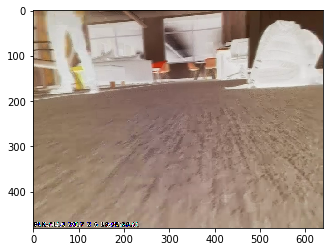

[0.32213432, 0.33992714, 0.11125819, 0.22668026]
bb


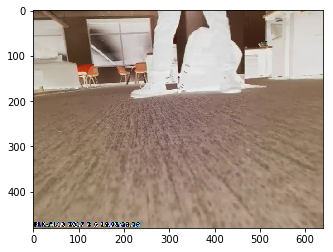

[0.25021338, 0.33499461, 0.22458847, 0.19020361]
bb


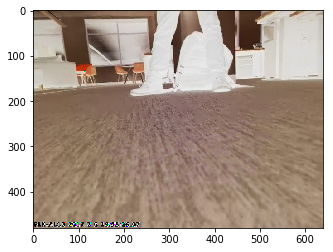

[0.37494078, 0.39498094, 0.031702321, 0.198376]
bb


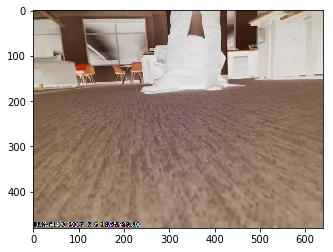

[0.12648763, 0.77182972, 0.08941742, 0.012265243]
bb


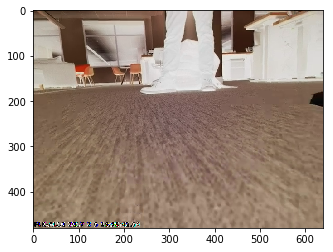

[0.35113081, 0.16607471, 0.35294804, 0.12984644]
ll


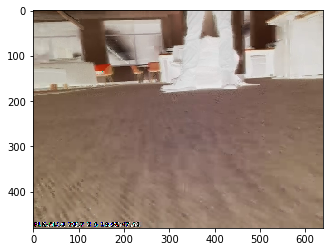

[0.23401181, 0.48145738, 0.23799004, 0.046540719]
bb


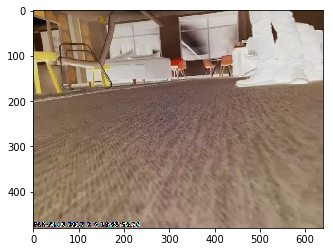

[0.58799267, 0.17294043, 0.043574173, 0.19549267]
ff


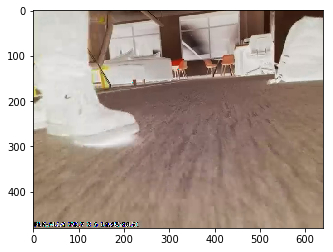

[0.52141911, 0.22449811, 0.13650249, 0.11758029]
ff


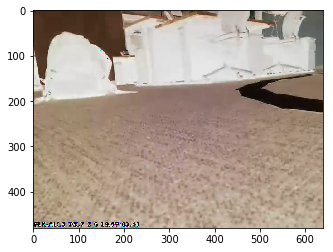

[0.32058746, 0.28062168, 0.12518089, 0.27360994]
ff


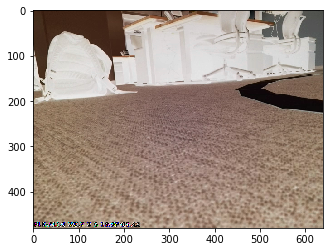

[0.42435375, 0.32752112, 0.085059077, 0.16306615]
ff


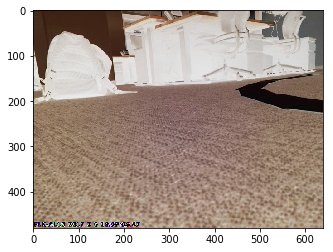

[0.53769791, 0.20514981, 0.080490477, 0.17666183]
ff


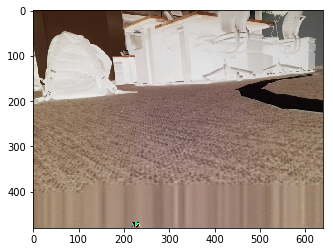

[0.16000241, 0.5840472, 0.066191219, 0.18975917]
bb


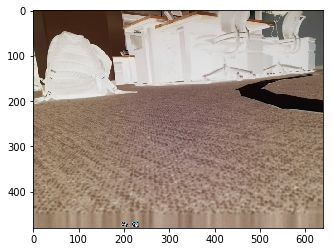

[0.32248247, 0.44739801, 0.041816015, 0.18830343]
bb


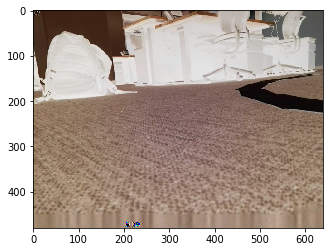

[0.27681968, 0.44998959, 0.090193503, 0.18299717]
bb


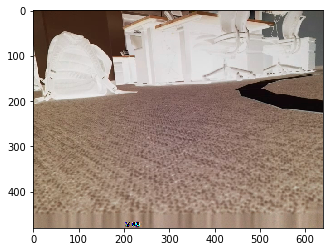

[0.28980717, 0.37286732, 0.12328076, 0.21404475]
bb


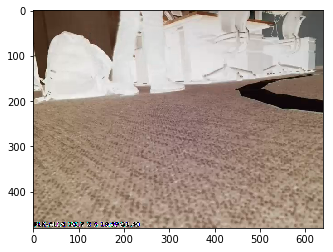

[0.16700381, 0.48925284, 0.082500279, 0.26124302]
bb


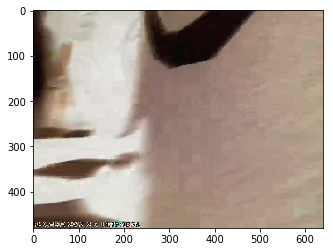

[0.33306989, 0.53371423, 0.038138323, 0.095077522]
bb


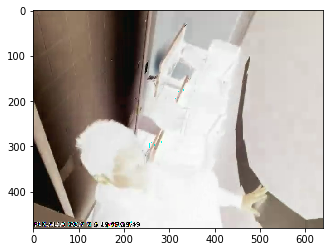

[0.38364327, 0.10408819, 0.40717649, 0.10509203]
ll


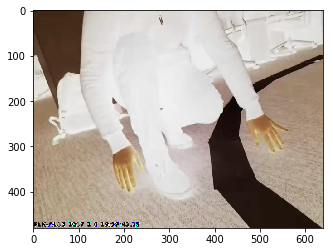

[0.059339914, 0.050063688, 0.80623895, 0.08435747]
ll


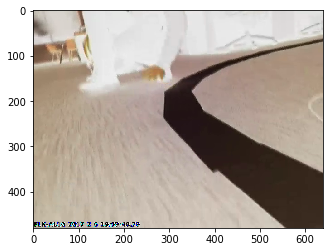

[0.27853689, 0.26994565, 0.43125111, 0.020266306]
ll


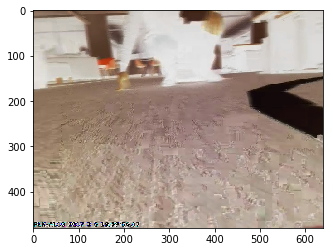

[0.59581405, 0.073660932, 0.077642351, 0.25288266]
ff


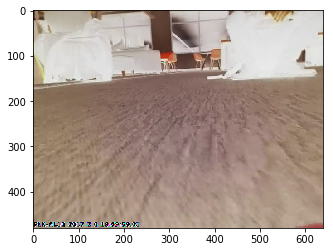

[0.45432845, 0.27769798, 0.031585101, 0.23638843]
ff


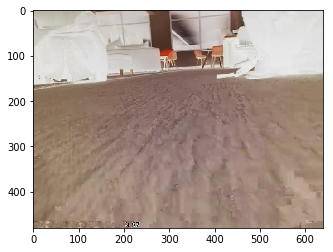

[0.73566431, 0.17473397, 0.027958717, 0.061642986]
ff


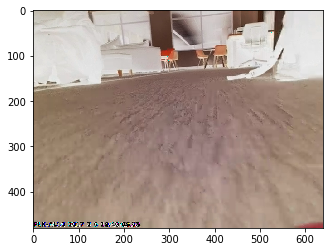

[0.69227642, 0.12215533, 0.022386065, 0.16318223]
ff


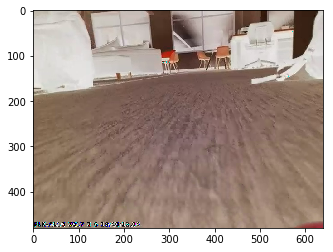

[0.11293443, 0.82518661, 0.052156229, 0.0097227031]
bb


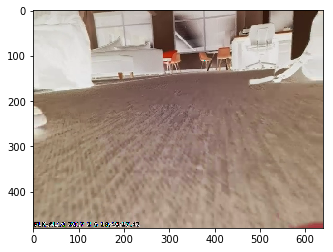

[0.34664962, 0.36073026, 0.052780155, 0.23983993]
bb


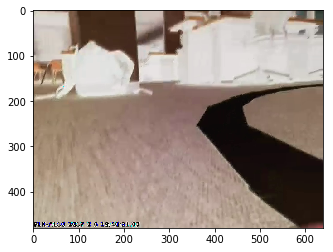

[0.75510955, 0.15858057, 0.034588318, 0.051721536]
ff


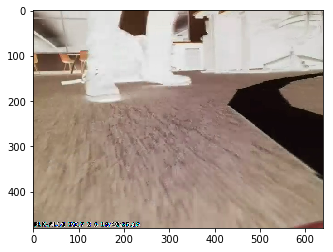

[0.3518734, 0.44765618, 0.10003322, 0.10043719]
bb


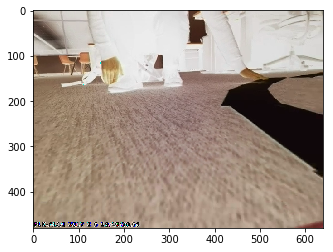

[0.31494457, 0.2948176, 0.020647982, 0.36958981]
rr


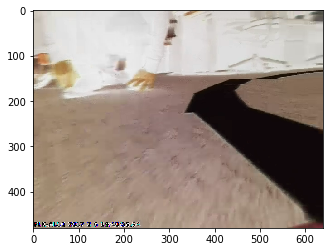

[0.61123782, 0.16536984, 0.088379242, 0.13501318]
ff


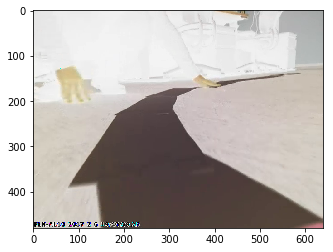

[0.025709538, 0.70047313, 0.25895962, 0.014857659]
bb


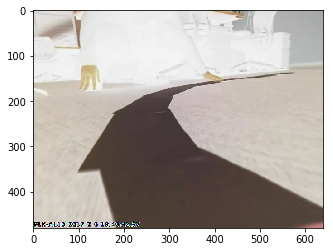

[0.024752926, 0.46335277, 0.49175981, 0.020134432]
ll


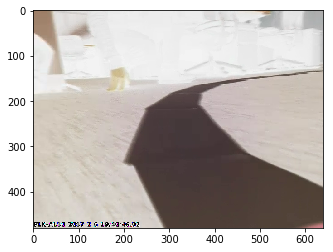

[0.25476778, 0.22754884, 0.50888336, 0.008800013]
ll


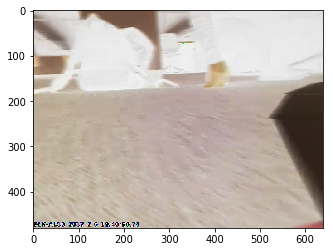

[0.16319071, 0.25246486, 0.45722714, 0.12711729]
ll


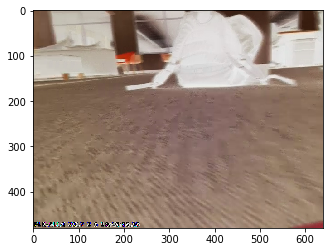

[0.41753766, 0.45142624, 0.011383964, 0.11965219]
bb


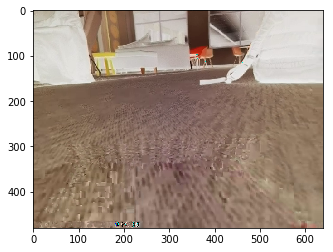

[0.47677481, 0.39984789, 0.015441236, 0.10793602]
ff


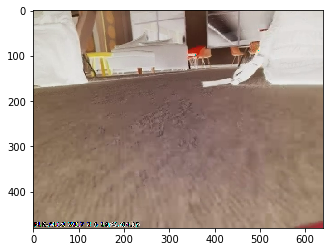

[0.29983515, 0.59306204, 0.040119495, 0.06698323]
bb


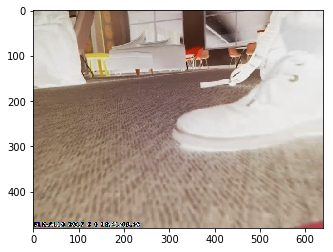

[0.78451896, 0.056390889, 0.0091783246, 0.14991178]
ff


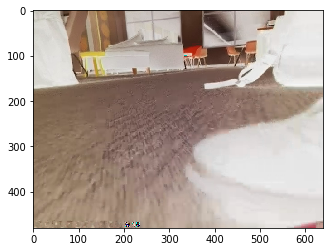

[0.92699248, 0.047359545, 0.0016324498, 0.024015587]
ff


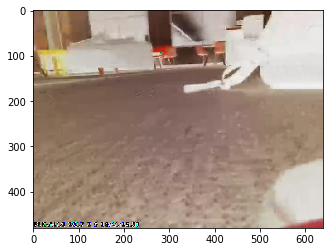

[0.34099969, 0.60413003, 0.0081549659, 0.046715338]
bb


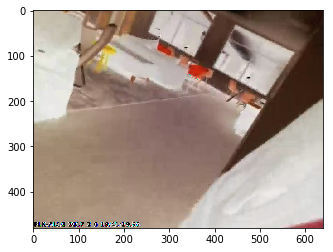

[0.2486476, 0.11801352, 0.1468897, 0.48644918]
rr


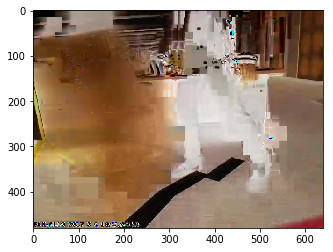

[0.28581735, 0.18298748, 0.43138251, 0.099812664]
ll


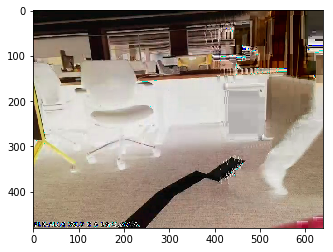

[0.37488267, 0.07048554, 0.46254787, 0.092083961]
ll


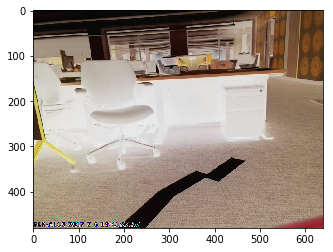

[0.30584046, 0.13781281, 0.46740463, 0.088942073]
ll


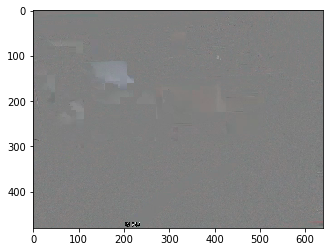

[0.066036917, 0.93296599, 0.00081846886, 0.00017857603]
bb


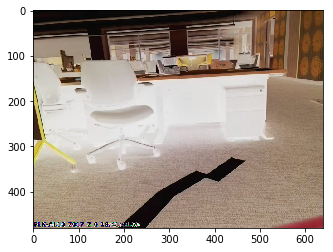

[0.19789611, 0.21813396, 0.44422537, 0.13974459]
ll


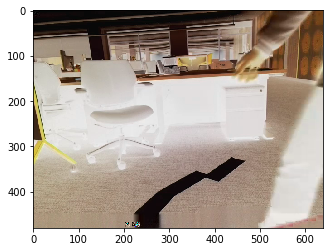

[0.22454476, 0.15517902, 0.52160209, 0.098674148]
ll


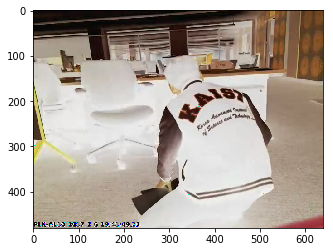

[0.11616102, 0.48459533, 0.36646989, 0.032773793]
bb


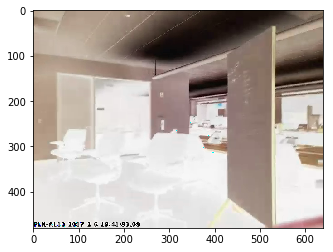

[0.083088495, 0.56403828, 0.074554034, 0.27831921]
bb


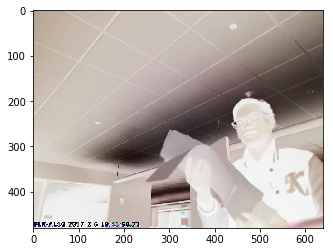

[0.14535373, 0.15733673, 0.60081142, 0.096498176]
ll


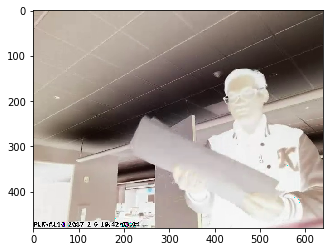

[0.072666362, 0.14392285, 0.055212948, 0.72819787]
rr


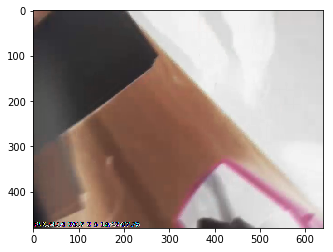

[0.025895586, 0.77471429, 0.013339538, 0.18605062]
bb


TypeError: unsupported operand type(s) for -: 'NoneType' and 'int'

In [22]:
import threading, cv2, time
import socket
%matplotlib inline
import matplotlib.pyplot as plt

class Grabber(threading.Thread):
    def __init__(self, cam):
        threading.Thread.__init__(self)
        self.cam = cam
        self.lock = threading.Lock()
        self.running = True
        self.start()
    def run(self):
        while self.running:
            time.sleep(0.01)
            with self.lock:
                self.cam.grab()
    def stop(self):
        self.running = False
    def retrieve(self):
        with self.lock:
            return self.cam.retrieve()
    def restart(self):
        self.cam.set(cv2.CAP_PROP_POS_FRAMES, 0)
        

address = ('10.157.120.38', 8009)
s = socket.socket(socket.AF_INET, socket.SOCK_STREAM)
s.connect(address)


camera = Grabber(cv2.VideoCapture("rtsp://10.155.70.237:5554/playlist.m3u"))

with tf.Session(graph=graph) as session:
    saver.restore(session, "./model100.ckpt")
#     tf.global_variables_initializer().run()    
    print('Initialized')
    while 1:
        time.sleep(1.2)
        ret, raw = camera.retrieve()

        raw = (raw-128)/256.0
        plt.imshow(raw*256.0+128)
        plt.show()
        
        if ret:
            feed_dict = {tf_test_data: np.array([raw])}
            prediction = session.run(test_prediction, feed_dict=feed_dict)
            prediction = list(prediction[0])
            print prediction
            if prediction.index(max(prediction))==0:
                s.send("ff 0.4")
                print "ff"
            elif prediction.index(max(prediction))==1:
                s.send("bb 0.3")
                print "bb"
            elif prediction.index(max(prediction))==2:
                s.send("ll 0.4")
                print "ll"
            elif prediction.index(max(prediction))==3:
                s.send("rr 0.4")
                print "rr"

                